In [45]:
import pandas as pd
import numpy as np
from matplotlib import pyplot
from scipy import optimize
%matplotlib inline

In [46]:
data = pd.read_csv('Genetics.csv', sep=',')
x = data[['Age','Gender','Gene_X_Expression','Gene_Y_Expression','SmokingStatus','DiseaseStatus']]
y = data['TreatmentResponse']


In [47]:
x.head()

,Age,Gender,Gene_X_Expression,Gene_Y_Expression,SmokingStatus,DiseaseStatus
0,45,0,5.78,3.21,1,1
1,62,1,7.12,5.89,2,2
2,38,0,3.15,1.98,0,0
3,55,1,6.54,4.76,1,1
4,71,0,8.01,6.55,2,2


FUNCION SIGMODEA

In [48]:
def sigmoide(z):
    z= np.array(z)
    g = np.array(z.shape)
    g = 1/(1+np.exp(-z))
    return g


In [49]:
m = 1000
x = np.concat([np.ones((m,1)),x], axis=1)
ner = pd.DataFrame(x)

print(ner)

       0     1    2     3     4    5    6
0    1.0  45.0  0.0  5.78  3.21  1.0  1.0
1    1.0  62.0  1.0  7.12  5.89  2.0  2.0
2    1.0  38.0  0.0  3.15  1.98  0.0  0.0
3    1.0  55.0  1.0  6.54  4.76  1.0  1.0
4    1.0  71.0  0.0  8.01  6.55  2.0  2.0
..   ...   ...  ...   ...   ...  ...  ...
995  1.0  38.0  1.0  2.62  2.41  0.0  0.0
996  1.0  39.0  0.0  2.73  2.52  0.0  0.0
997  1.0  40.0  1.0  2.84  2.63  0.0  0.0
998  1.0  41.0  0.0  2.95  2.74  0.0  0.0
999  1.0  42.0  1.0  3.06  2.85  0.0  0.0

[1000 rows x 7 columns]


FUNCION DE COSTO Y GRADIENTE

In [50]:
def funCosto(theta,x,y):
    m = y.size
    j = 0
    h = sigmoide(x.dot(theta.T))
    j = 1/m * np.sum(-y.dot(np.log(h)) - (1 - y).dot(np.log(1 - h)))
    return j


In [51]:
def gradiente(theta,x,y,alpha,num_iters):
    m = y.shape[0]
    theta = theta.copy()
    j_history = []

    for i in range(num_iters):
        h = sigmoide(x.dot(theta.T))
        theta = theta - (alpha / m) * (h - y).dot(x)

        j_history.append(funCosto(theta, x, y))
    return theta, j_history


GRAFICA DE LA CONVERGENCIA DEL COSTO

C:\Users\ACER\AppData\Local\Temp\ipykernel_7436\2907708030.py:5: RuntimeWarning: divide by zero encountered in log
  j = 1/m * np.sum(-y.dot(np.log(h)) - (1 - y).dot(np.log(1 - h)))
C:\Users\ACER\AppData\Local\Temp\ipykernel_7436\2907708030.py:5: RuntimeWarning: divide by zero encountered in log
  j = 1/m * np.sum(-y.dot(np.log(h)) - (1 - y).dot(np.log(1 - h)))
C:\Users\ACER\AppData\Local\Temp\ipykernel_7436\2907708030.py:5: RuntimeWarning: divide by zero encountered in log
  j = 1/m * np.sum(-y.dot(np.log(h)) - (1 - y).dot(np.log(1 - h)))
C:\Users\ACER\AppData\Local\Temp\ipykernel_7436\2907708030.py:5: RuntimeWarning: divide by zero encountered in log
  j = 1/m * np.sum(-y.dot(np.log(h)) - (1 - y).dot(np.log(1 - h)))
C:\Users\ACER\AppData\Local\Temp\ipykernel_7436\2907708030.py:5: RuntimeWarning: divide by zero encountered in log
  j = 1/m * np.sum(-y.dot(np.log(h)) - (1 - y).dot(np.log(1 - h)))
C:\Users\ACER\AppData\Local\Temp\ipykernel_7436\2907708030.py:5: RuntimeWarning: divide by

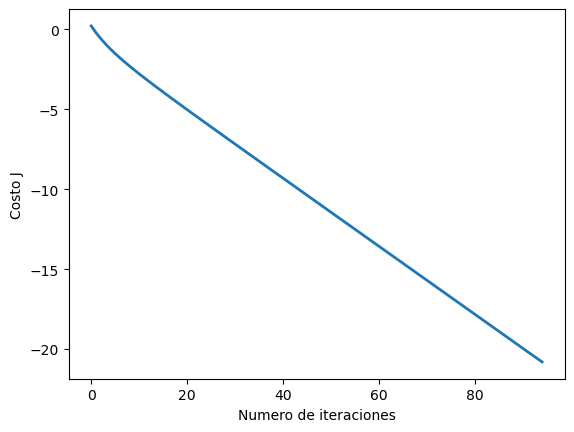

In [52]:
alpha = 0.0001
num_iters = 50000

# inicializa theta y ejecuta el descenso por el gradiente
theta = np.zeros(7)
theta, j_history = gradiente(theta, x, y, alpha, num_iters)

# Grafica la convergencia del costo
pyplot.plot(np.arange(len(j_history)), j_history, lw=2)
pyplot.xlabel('Numero de iteraciones')
pyplot.ylabel('Costo J')
pyplot.show()

NO CONVERGE
